### Importing the libraries

In [1]:
import pandas as pd
from sklearn.model_selection import train_test_split
import numpy as np
from keras.layers import LSTM, Dense, Softmax
from keras.models import Sequential
from sklearn.preprocessing import MinMaxScaler, Normalizer
import matplotlib.pyplot as plt
import random
from keras import regularizers, initializers
from keras.metrics import mean_squared_error
from math import sqrt
%matplotlib inline

min_max = MinMaxScaler(feature_range=(0,1))

### Collecting the data

###### Reading the dataset

In [9]:
path = "ny.csv"
ny_dataset = pd.read_csv(path)
ny_dataset = ny_dataset.loc[:, ~ny_dataset.columns.str.contains('^Unnamed')] # Removing the unnamed column
ny_dataset.set_index("id", inplace=True) # Setting the id as the index
ny_dataset

,distance to target,period,trip_time_in_secs,trip_distance,longitude,latitude,is_pickup
id,,,,,,,
1,1440.000000,0,487,2.60,-73.976624,40.751686,1
1,1279.083333,0,487,2.60,-73.949348,40.776871,0
1,1272.616667,0,1166,3.10,-73.948524,40.778000,1
1,1265.766667,0,1166,3.10,-73.978966,40.780052,0
1,1262.483333,0,380,1.50,-73.979164,40.780136,1
...,...,...,...,...,...,...,...
143,1403.000000,0,0,0.00,0.000000,0.000000,0
143,1426.000000,0,600,3.46,-73.970535,40.756302,1
143,1436.000000,0,600,3.46,-73.922325,40.762981,0


###### Plotting the columns

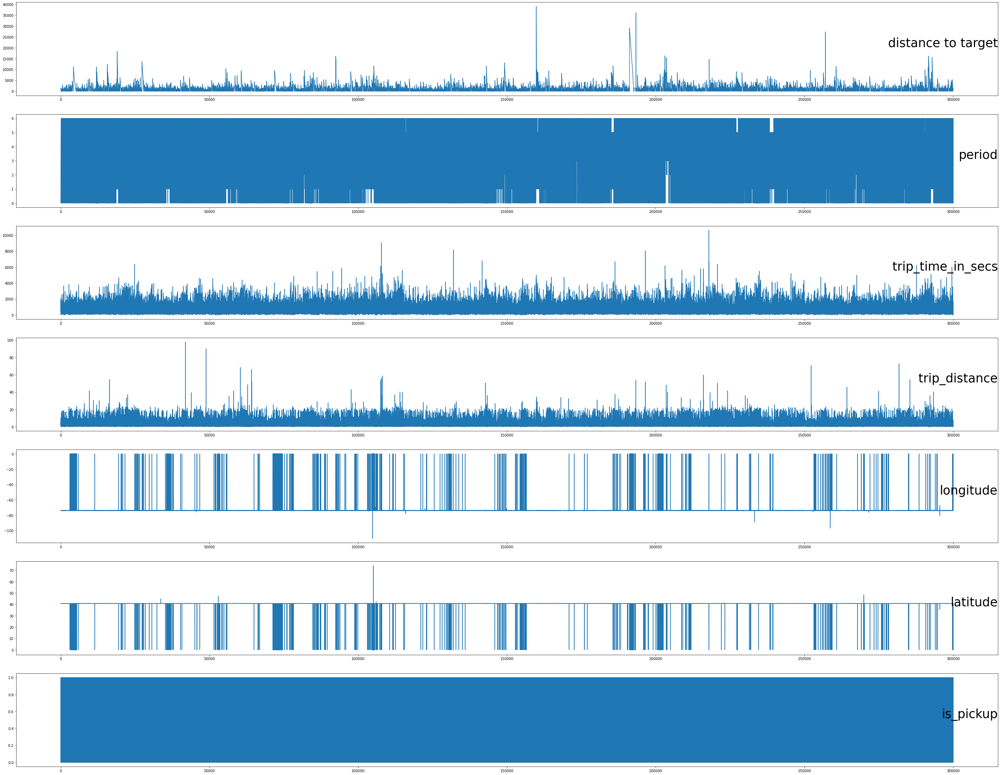

In [4]:
values = ny_dataset.values
groups = [i for i in range(len(list(ny_dataset.columns)))]
i = 1
plt.figure(figsize=(50,40))
for group in groups:
    plt.subplot(len(groups), 1, i)
    plt.plot(values[:, group])
    plt.title(ny_dataset.columns[group], y=0.5, loc='right', fontsize=35)
    i += 1
plt.show()

###### Pre-processing the data

In [6]:
# Scaler function:

def scaling(data):
    min_max = MinMaxScaler()
    scaler = min_max.fit(data)
    scaled = scaler.transform(data)
    scaled_list = [i[0] for i in scaled]
    return scaled_list, scaler

In [8]:
# Scaling the columns

dtt_scaled, dtt_scaler = scaling(ny_dataset["distance to target"].values.reshape(-1,1))
per_scaled, per_scaler = scaling(ny_dataset["period"].values.reshape(-1,1))
tts_scaled, tts_scaler = scaling(ny_dataset["trip_time_in_secs"].values.reshape(-1,1))
trd_scaled, trd_scaler = scaling(ny_dataset["trip_distance"].values.reshape(-1,1))
long_scaled, long_scaler = scaling(ny_dataset["longitude"].values.reshape(-1,1))
lat_scaled, lat_scaler = scaling(ny_dataset["latitude"].values.reshape(-1,1))
ispick_scaled, ispick_scaler = scaling(ny_dataset["is_pickup"].values.reshape(-1,1))


# Creating the new dataset with the sclaed values

ny_scaled_dataset = pd.DataFrame(columns=ny_dataset.columns)
ny_scaled_dataset["distance to target"] = dtt_scaled
ny_scaled_dataset["period"] = per_scaled
ny_scaled_dataset["trip_time_in_secs"] = tts_scaled
ny_scaled_dataset["trip_distance"] = trd_scaled
ny_scaled_dataset["longitude"] = long_scaled
ny_scaled_dataset["latitude"] = lat_scaled
ny_scaled_dataset["is_pickup"] = ispick_scaled
ny_scaled_dataset = ny_scaled_dataset.set_index(ny_dataset.index) # Setting index as id
ny_scaled_dataset

,distance to target,period,trip_time_in_secs,trip_distance,longitude,latitude,is_pickup
id,,,,,,,
1,0.036947,0.0,0.045857,0.026585,0.330748,0.554043,1.0
1,0.032818,0.0,0.045857,0.026585,0.330995,0.554381,0.0
1,0.032652,0.0,0.109793,0.031697,0.331003,0.554396,1.0
1,0.032476,0.0,0.109793,0.031697,0.330727,0.554423,0.0
1,0.032392,0.0,0.035782,0.015337,0.330725,0.554424,1.0
...,...,...,...,...,...,...,...
143,0.035997,0.0,0.000000,0.000000,1.000000,0.007554,0.0
143,0.036588,0.0,0.056497,0.035378,0.330803,0.554105,1.0
143,0.036844,0.0,0.056497,0.035378,0.331240,0.554194,0.0


In [12]:
# Shifting the dataset by 1 to make it a time series data

shift_dataset = ny_scaled_dataset.shift(1)
shift_dataset["Output_dtt"] = ny_scaled_dataset["distance to target"]
shift_dataset.dropna(inplace=True) # Dropping the columns which has NAN values in it
shift_dataset

,distance to target,period,trip_time_in_secs,trip_distance,longitude,latitude,is_pickup,Output_dtt
id,,,,,,,,
1,0.036947,0.0,0.045857,0.026585,0.330748,0.554043,1.0,0.032818
1,0.032818,0.0,0.045857,0.026585,0.330995,0.554381,0.0,0.032652
1,0.032652,0.0,0.109793,0.031697,0.331003,0.554396,1.0,0.032476
1,0.032476,0.0,0.109793,0.031697,0.330727,0.554423,0.0,0.032392
1,0.032392,0.0,0.035782,0.015337,0.330725,0.554424,1.0,0.032234
...,...,...,...,...,...,...,...,...
143,0.035997,0.0,0.000000,0.000000,1.000000,0.007554,1.0,0.035997
143,0.035997,0.0,0.000000,0.000000,1.000000,0.007554,0.0,0.036588
143,0.036588,0.0,0.056497,0.035378,0.330803,0.554105,1.0,0.036844


In [13]:
# Splitting training and testing data:

train_data = shift_dataset.loc[1:50]
train_X = train_data.drop(["Output_dtt"], axis=1).values
train_X = train_X.reshape(train_X.shape[0],1,train_X.shape[1])
train_y = train_data["Output_dtt"].values

test_data = shift_dataset.loc[51:]
test_X = test_data.drop(["Output_dtt"], axis=1).values
test_X = test_X.reshape(test_X.shape[0],1,test_X.shape[1])
test_y = test_data["Output_dtt"].values

### LSTM Model

###### Designing the layers for the model

In [14]:
# LSTM layer (weights: HENormal)

def design_lstm_layer(n_neurons, input_X, return_seq, is_first = False):
    initializer = initializers.HeNormal()
    if is_first:
        layer = LSTM(n_neurons, 
                     input_shape=(input_X.shape[1], input_X.shape[2]), 
                     kernel_regularizer=regularizers.l2(0.00001),
                     kernel_initializer=initializer,
                     return_sequences = return_seq
                    )
    else:
        layer = LSTM(n_neurons, 
                     kernel_regularizer= None,
                     kernel_initializer=initializer,
                     return_sequences = return_seq
                    )
    return layer



# Dense layer (weights: HENormal)

def design_dense_layer(output_size):
    initializer = initializers.HeNormal()
    layer = Dense(output_size, kernel_initializer=initializer, activation='relu')
    return layer

###### Designing the model

In [27]:
lstm_model = Sequential()
lstm_model.add(design_lstm_layer(n_neurons=50, input_X=train_X, return_seq=True, is_first=True))
lstm_model.add(design_lstm_layer(n_neurons=20, input_X=train_X, return_seq=True, is_first=False))
lstm_model.add(design_lstm_layer(n_neurons=20, input_X=train_X, return_seq=True, is_first=False))
lstm_model.add(design_dense_layer(output_size=1))
lstm_model.compile(loss='mae', optimizer="adam")

###### Training the model

In [28]:
lstmhistory = lstm_model.fit(train_X, train_y, epochs=50, batch_size = 72, verbose=1, validation_data=(test_X, test_y), shuffle=False)

Epoch 1/50
1493/1493 [==============================] - 9s 4ms/step - loss: 0.0363 - val_loss: 0.0375
Epoch 2/50
1493/1493 [==============================] - 6s 4ms/step - loss: 0.0353 - val_loss: 0.0369
Epoch 3/50
1493/1493 [==============================] - 6s 4ms/step - loss: 0.0335 - val_loss: 0.0075
Epoch 4/50
1493/1493 [==============================] - 6s 4ms/step - loss: 0.0039 - val_loss: 0.0025
Epoch 5/50
1493/1493 [==============================] - 7s 5ms/step - loss: 0.0024 - val_loss: 0.0037
Epoch 6/50
1493/1493 [==============================] - 8s 5ms/step - loss: 0.0026 - val_loss: 0.0024
Epoch 7/50
1493/1493 [==============================] - 7s 4ms/step - loss: 0.0023 - val_loss: 0.0032
Epoch 8/50
1493/1493 [==============================] - 7s 4ms/step - loss: 0.0021 - val_loss: 0.0020
Epoch 9/50
1493/1493 [==============================] - 7s 5ms/step - loss: 0.0020 - val_loss: 0.0021
Epoch 10/50
1493/1493 [==============================] - 7s 4ms/step - loss: 0.002

###### Plotting the test and train loss

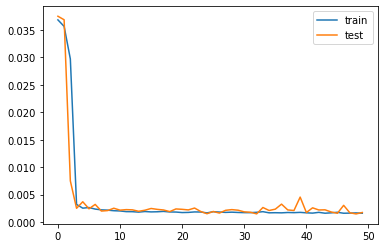

In [29]:
plt.plot(lstmhistory.history['loss'], label='train')
plt.plot(lstmhistory.history['val_loss'], label='test')
plt.legend()
plt.show()

###### Predicting the test values

In [30]:
predictions = lstm_model.predict(test_X)

In [31]:
# Reshaping the predictions for calculating the rmse

# Check this part of the code ------------------------------------------------------------
y_out = [i[0][0] for i in predictions]
y_out = np.array(y_out)
y_out = y_out.reshape(-1,1)
# -----------------------------------------------------------------------------------------

final_predictions = dtt_scaler.inverse_transform(y_out)
final_predictions = [round(i[0]) for i in final_predictions]
final_predictions.pop(0) # Removing the 1st prediciton value since it belongs to the training set


# Reshaping the actual output values
actual = np.array(shift_dataset["Output_dtt"].loc[51:]).reshape(-1,1)
actual = dtt_scaler.inverse_transform(actual)
actual = list(actual.flatten())
final_actual = [round(i) for i in actual]
final_actual.pop() # Removing the last output value to maintain the same length

1456

In [32]:
for i,j in zip(final_predictions, final_actual):
    print("Predicted: {} ------------------ Actual: {}".format(i, j))

Predicted: 1412 ------------------ Actual: 1440
Predicted: 1908 ------------------ Actual: 1943
Predicted: 1887 ------------------ Actual: 1927
Predicted: 1837 ------------------ Actual: 1871
Predicted: 1788 ------------------ Actual: 1826
Predicted: 1107 ------------------ Actual: 1126
Predicted: 1065 ------------------ Actual: 1087
Predicted: 1027 ------------------ Actual: 1045
Predicted: 993 ------------------ Actual: 1014
Predicted: 993 ------------------ Actual: 1009
Predicted: 975 ------------------ Actual: 995
Predicted: 976 ------------------ Actual: 993
Predicted: 944 ------------------ Actual: 963
Predicted: 937 ------------------ Actual: 952
Predicted: 909 ------------------ Actual: 926
Predicted: 831 ------------------ Actual: 844
Predicted: 831 ------------------ Actual: 844
Predicted: 787 ------------------ Actual: 799
Predicted: 766 ------------------ Actual: 778
Predicted: 762 ------------------ Actual: 772
Predicted: 730 ------------------ Actual: 744
Predicted: 538 -

Predicted: 304 ------------------ Actual: 308
Predicted: 286 ------------------ Actual: 288
Predicted: 278 ------------------ Actual: 282
Predicted: 273 ------------------ Actual: 274
Predicted: 251 ------------------ Actual: 254
Predicted: 234 ------------------ Actual: 235
Predicted: 225 ------------------ Actual: 228
Predicted: 209 ------------------ Actual: 210
Predicted: 205 ------------------ Actual: 209
Predicted: 194 ------------------ Actual: 195
Predicted: 182 ------------------ Actual: 185
Predicted: 141 ------------------ Actual: 141
Predicted: 137 ------------------ Actual: 140
Predicted: 126 ------------------ Actual: 125
Predicted: 121 ------------------ Actual: 123
Predicted: 116 ------------------ Actual: 116
Predicted: 112 ------------------ Actual: 115
Predicted: 106 ------------------ Actual: 106
Predicted: 67 ------------------ Actual: 68
Predicted: 62 ------------------ Actual: 60
Predicted: 58 ------------------ Actual: 59
Predicted: 44 ------------------ Actual:

Predicted: 48 ------------------ Actual: 45
Predicted: 50 ------------------ Actual: 44
Predicted: 30 ------------------ Actual: 26
Predicted: 25 ------------------ Actual: 18
Predicted: 14 ------------------ Actual: 10
Predicted: 12 ------------------ Actual: 5
Predicted: 5 ------------------ Actual: 1
Predicted: 7 ------------------ Actual: 0
Predicted: 904 ------------------ Actual: 913
Predicted: 519 ------------------ Actual: 520
Predicted: 502 ------------------ Actual: 501
Predicted: 493 ------------------ Actual: 490
Predicted: 474 ------------------ Actual: 472
Predicted: 470 ------------------ Actual: 466
Predicted: 461 ------------------ Actual: 462
Predicted: 463 ------------------ Actual: 461
Predicted: 456 ------------------ Actual: 457
Predicted: 439 ------------------ Actual: 437
Predicted: 429 ------------------ Actual: 428
Predicted: 423 ------------------ Actual: 420
Predicted: 420 ------------------ Actual: 412
Predicted: 423 ------------------ Actual: 410
Predicted

Predicted: 337 ------------------ Actual: 335
Predicted: 337 ------------------ Actual: 332
Predicted: 321 ------------------ Actual: 317
Predicted: 322 ------------------ Actual: 316
Predicted: 314 ------------------ Actual: 312
Predicted: 312 ------------------ Actual: 308
Predicted: 300 ------------------ Actual: 298
Predicted: 297 ------------------ Actual: 292
Predicted: 284 ------------------ Actual: 281
Predicted: 280 ------------------ Actual: 274
Predicted: 270 ------------------ Actual: 268
Predicted: 270 ------------------ Actual: 265
Predicted: 261 ------------------ Actual: 257
Predicted: 260 ------------------ Actual: 253
Predicted: 255 ------------------ Actual: 248
Predicted: 252 ------------------ Actual: 241
Predicted: 229 ------------------ Actual: 220
Predicted: 227 ------------------ Actual: 216
Predicted: 220 ------------------ Actual: 213
Predicted: 220 ------------------ Actual: 211
Predicted: 210 ------------------ Actual: 204
Predicted: 206 ------------------ 

Predicted: 1450 ------------------ Actual: 1471
Predicted: 1443 ------------------ Actual: 1468
Predicted: 1445 ------------------ Actual: 1465
Predicted: 1443 ------------------ Actual: 1463
Predicted: 1437 ------------------ Actual: 1454
Predicted: 1430 ------------------ Actual: 1453
Predicted: 1420 ------------------ Actual: 1439
Predicted: 1415 ------------------ Actual: 1437
Predicted: 1411 ------------------ Actual: 1430
Predicted: 1396 ------------------ Actual: 1418
Predicted: 1386 ------------------ Actual: 1405
Predicted: 1379 ------------------ Actual: 1399
Predicted: 1375 ------------------ Actual: 1392
Predicted: 1363 ------------------ Actual: 1381
Predicted: 1359 ------------------ Actual: 1375
Predicted: 1351 ------------------ Actual: 1369
Predicted: 1343 ------------------ Actual: 1358
Predicted: 1333 ------------------ Actual: 1349
Predicted: 1335 ------------------ Actual: 1346
Predicted: 1298 ------------------ Actual: 1310
Predicted: 1272 ------------------ Actua

Predicted: 74 ------------------ Actual: 72
Predicted: 64 ------------------ Actual: 59
Predicted: 56 ------------------ Actual: 54
Predicted: 44 ------------------ Actual: 39
Predicted: 40 ------------------ Actual: 37
Predicted: 40 ------------------ Actual: 32
Predicted: 35 ------------------ Actual: 30
Predicted: 28 ------------------ Actual: 20
Predicted: 14 ------------------ Actual: 10
Predicted: 8 ------------------ Actual: 0
Predicted: 602 ------------------ Actual: 607
Predicted: 602 ------------------ Actual: 605
Predicted: 589 ------------------ Actual: 594
Predicted: 589 ------------------ Actual: 591
Predicted: 575 ------------------ Actual: 579
Predicted: 577 ------------------ Actual: 579
Predicted: 558 ------------------ Actual: 563
Predicted: 554 ------------------ Actual: 557
Predicted: 541 ------------------ Actual: 546
Predicted: 543 ------------------ Actual: 545
Predicted: 538 ------------------ Actual: 542
Predicted: 539 ------------------ Actual: 541
Predicted:

Predicted: 2993 ------------------ Actual: 3045
Predicted: 2973 ------------------ Actual: 3023
Predicted: 2958 ------------------ Actual: 3009
Predicted: 2955 ------------------ Actual: 3001
Predicted: 2943 ------------------ Actual: 2995
Predicted: 2943 ------------------ Actual: 2992
Predicted: 2933 ------------------ Actual: 2985
Predicted: 2925 ------------------ Actual: 2974
Predicted: 2905 ------------------ Actual: 2969
Predicted: 2902 ------------------ Actual: 2959
Predicted: 2892 ------------------ Actual: 2957
Predicted: 2890 ------------------ Actual: 2947
Predicted: 2868 ------------------ Actual: 2932
Predicted: 2869 ------------------ Actual: 2925
Predicted: 2860 ------------------ Actual: 2924
Predicted: 2859 ------------------ Actual: 2912
Predicted: 2843 ------------------ Actual: 2903
Predicted: 2825 ------------------ Actual: 2877
Predicted: 2490 ------------------ Actual: 2541
Predicted: 2495 ------------------ Actual: 2540
Predicted: 2480 ------------------ Actua

Predicted: 35 ------------------ Actual: 25
Predicted: 35 ------------------ Actual: 22
Predicted: 24 ------------------ Actual: 15
Predicted: 23 ------------------ Actual: 7
Predicted: 10 ------------------ Actual: 0
Predicted: 1164 ------------------ Actual: 1173
Predicted: 1161 ------------------ Actual: 1171
Predicted: 1145 ------------------ Actual: 1154
Predicted: 1135 ------------------ Actual: 1144
Predicted: 1125 ------------------ Actual: 1133
Predicted: 1095 ------------------ Actual: 1103
Predicted: 1084 ------------------ Actual: 1091
Predicted: 1077 ------------------ Actual: 1084
Predicted: 1059 ------------------ Actual: 1065
Predicted: 1006 ------------------ Actual: 1012
Predicted: 987 ------------------ Actual: 992
Predicted: 961 ------------------ Actual: 966
Predicted: 953 ------------------ Actual: 958
Predicted: 952 ------------------ Actual: 957
Predicted: 947 ------------------ Actual: 951
Predicted: 941 ------------------ Actual: 946
Predicted: 923 -----------

Predicted: 1933 ------------------ Actual: 1970
Predicted: 1936 ------------------ Actual: 1968
Predicted: 1923 ------------------ Actual: 1961
Predicted: 1927 ------------------ Actual: 1959
Predicted: 1909 ------------------ Actual: 1946
Predicted: 1911 ------------------ Actual: 1942
Predicted: 1903 ------------------ Actual: 1938
Predicted: 1898 ------------------ Actual: 1926
Predicted: 1878 ------------------ Actual: 1912
Predicted: 1880 ------------------ Actual: 1911
Predicted: 1874 ------------------ Actual: 1907
Predicted: 1878 ------------------ Actual: 1905
Predicted: 1867 ------------------ Actual: 1899
Predicted: 1862 ------------------ Actual: 1888
Predicted: 1847 ------------------ Actual: 1879
Predicted: 1836 ------------------ Actual: 1863
Predicted: 1814 ------------------ Actual: 1845
Predicted: 1810 ------------------ Actual: 1837
Predicted: 1805 ------------------ Actual: 1836
Predicted: 1803 ------------------ Actual: 1829
Predicted: 1780 ------------------ Actua

Predicted: 573 ------------------ Actual: 570
Predicted: 535 ------------------ Actual: 533
Predicted: 531 ------------------ Actual: 528
Predicted: 513 ------------------ Actual: 511
Predicted: 502 ------------------ Actual: 498
Predicted: 500 ------------------ Actual: 497
Predicted: 490 ------------------ Actual: 486
Predicted: 477 ------------------ Actual: 473
Predicted: 470 ------------------ Actual: 465
Predicted: 462 ------------------ Actual: 458
Predicted: 459 ------------------ Actual: 454
Predicted: 444 ------------------ Actual: 441
Predicted: 437 ------------------ Actual: 432
Predicted: 436 ------------------ Actual: 431
Predicted: 428 ------------------ Actual: 422
Predicted: 422 ------------------ Actual: 416
Predicted: 400 ------------------ Actual: 404
Predicted: 388 ------------------ Actual: 394
Predicted: 381 ------------------ Actual: 383
Predicted: 362 ------------------ Actual: 367
Predicted: 350 ------------------ Actual: 352
Predicted: 343 ------------------ 

Predicted: 4445 ------------------ Actual: 4543
Predicted: 4446 ------------------ Actual: 4535
Predicted: 4435 ------------------ Actual: 4532
Predicted: 4425 ------------------ Actual: 4513
Predicted: 4413 ------------------ Actual: 4509
Predicted: 4403 ------------------ Actual: 4488
Predicted: 4384 ------------------ Actual: 4479
Predicted: 4376 ------------------ Actual: 4462
Predicted: 4365 ------------------ Actual: 4460
Predicted: 4364 ------------------ Actual: 4452
Predicted: 4361 ------------------ Actual: 4451
Predicted: 4358 ------------------ Actual: 4440
Predicted: 4308 ------------------ Actual: 4404
Predicted: 4303 ------------------ Actual: 4392
Predicted: 4278 ------------------ Actual: 4372
Predicted: 4279 ------------------ Actual: 4367
Predicted: 4181 ------------------ Actual: 4269
Predicted: 4177 ------------------ Actual: 4259
Predicted: 4158 ------------------ Actual: 4247
Predicted: 4154 ------------------ Actual: 4237
Predicted: 4139 ------------------ Actua

Predicted: 107 ------------------ Actual: 105
Predicted: 101 ------------------ Actual: 102
Predicted: 99 ------------------ Actual: 97
Predicted: 83 ------------------ Actual: 83
Predicted: 66 ------------------ Actual: 63
Predicted: 34 ------------------ Actual: 34
Predicted: 28 ------------------ Actual: 25
Predicted: 23 ------------------ Actual: 23
Predicted: 11 ------------------ Actual: 7
Predicted: 1 ------------------ Actual: 0
Predicted: 1811 ------------------ Actual: 1839
Predicted: 1796 ------------------ Actual: 1828
Predicted: 1804 ------------------ Actual: 1828
Predicted: 1786 ------------------ Actual: 1815
Predicted: 1783 ------------------ Actual: 1808
Predicted: 1773 ------------------ Actual: 1802
Predicted: 1768 ------------------ Actual: 1793
Predicted: 1758 ------------------ Actual: 1784
Predicted: 1739 ------------------ Actual: 1761
Predicted: 1725 ------------------ Actual: 1751
Predicted: 1726 ------------------ Actual: 1748
Predicted: 1713 ---------------

Predicted: 1468 ------------------ Actual: 1494
Predicted: 1459 ------------------ Actual: 1490
Predicted: 1455 ------------------ Actual: 1480
Predicted: 1444 ------------------ Actual: 1474
Predicted: 1442 ------------------ Actual: 1468
Predicted: 1434 ------------------ Actual: 1464
Predicted: 1429 ------------------ Actual: 1455
Predicted: 1406 ------------------ Actual: 1433
Predicted: 1408 ------------------ Actual: 1432
Predicted: 1301 ------------------ Actual: 1327
Predicted: 1297 ------------------ Actual: 1320
Predicted: 1290 ------------------ Actual: 1316
Predicted: 1290 ------------------ Actual: 1312
Predicted: 1268 ------------------ Actual: 1294
Predicted: 1267 ------------------ Actual: 1290
Predicted: 1239 ------------------ Actual: 1264
Predicted: 1239 ------------------ Actual: 1261
Predicted: 1156 ------------------ Actual: 1178
Predicted: 1150 ------------------ Actual: 1167
Predicted: 1140 ------------------ Actual: 1161
Predicted: 1135 ------------------ Actua

Predicted: 789 ------------------ Actual: 800
Predicted: 775 ------------------ Actual: 783
Predicted: 708 ------------------ Actual: 716
Predicted: 700 ------------------ Actual: 704
Predicted: 686 ------------------ Actual: 690
Predicted: 678 ------------------ Actual: 680
Predicted: 672 ------------------ Actual: 676
Predicted: 669 ------------------ Actual: 670
Predicted: 642 ------------------ Actual: 644
Predicted: 639 ------------------ Actual: 639
Predicted: 631 ------------------ Actual: 633
Predicted: 621 ------------------ Actual: 621
Predicted: 611 ------------------ Actual: 612
Predicted: 608 ------------------ Actual: 605
Predicted: 569 ------------------ Actual: 565
Predicted: 563 ------------------ Actual: 558
Predicted: 556 ------------------ Actual: 554
Predicted: 553 ------------------ Actual: 549
Predicted: 163 ------------------ Actual: 152
Predicted: 146 ------------------ Actual: 134
Predicted: 112 ------------------ Actual: 115
Predicted: 103 ------------------ 

Predicted: 793 ------------------ Actual: 796
Predicted: 783 ------------------ Actual: 784
Predicted: 754 ------------------ Actual: 756
Predicted: 751 ------------------ Actual: 751
Predicted: 741 ------------------ Actual: 743
Predicted: 726 ------------------ Actual: 727
Predicted: 345 ------------------ Actual: 339
Predicted: 344 ------------------ Actual: 337
Predicted: 334 ------------------ Actual: 328
Predicted: 318 ------------------ Actual: 310
Predicted: 306 ------------------ Actual: 300
Predicted: 303 ------------------ Actual: 294
Predicted: 280 ------------------ Actual: 273
Predicted: 275 ------------------ Actual: 266
Predicted: 245 ------------------ Actual: 236
Predicted: 228 ------------------ Actual: 218
Predicted: 222 ------------------ Actual: 215
Predicted: 209 ------------------ Actual: 199
Predicted: 194 ------------------ Actual: 187
Predicted: 191 ------------------ Actual: 181
Predicted: 185 ------------------ Actual: 177
Predicted: 173 ------------------ 

Predicted: 1462 ------------------ Actual: 1475
Predicted: 1454 ------------------ Actual: 1469
Predicted: 1436 ------------------ Actual: 1450
Predicted: 1431 ------------------ Actual: 1445
Predicted: 1429 ------------------ Actual: 1443
Predicted: 1408 ------------------ Actual: 1422
Predicted: 1406 ------------------ Actual: 1420
Predicted: 1388 ------------------ Actual: 1417
Predicted: 1369 ------------------ Actual: 1394
Predicted: 1358 ------------------ Actual: 1387
Predicted: 1348 ------------------ Actual: 1372
Predicted: 1331 ------------------ Actual: 1359
Predicted: 1331 ------------------ Actual: 1355
Predicted: 1322 ------------------ Actual: 1349
Predicted: 1324 ------------------ Actual: 1347
Predicted: 1302 ------------------ Actual: 1329
Predicted: 1305 ------------------ Actual: 1328
Predicted: 1298 ------------------ Actual: 1322
Predicted: 1291 ------------------ Actual: 1313
Predicted: 1288 ------------------ Actual: 1311
Predicted: 1273 ------------------ Actua

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




Predicted: 1417 ------------------ Actual: 1440
Predicted: 1413 ------------------ Actual: 1440
Predicted: 1417 ------------------ Actual: 1440
Predicted: 1413 ------------------ Actual: 1440
Predicted: 1421 ------------------ Actual: 1440
Predicted: 1416 ------------------ Actual: 1440
Predicted: 1419 ------------------ Actual: 1440
Predicted: 1415 ------------------ Actual: 1440
Predicted: 1419 ------------------ Actual: 1440
Predicted: 1415 ------------------ Actual: 1440
Predicted: 1419 ------------------ Actual: 1440
Predicted: 1415 ------------------ Actual: 1440
Predicted: 1419 ------------------ Actual: 1440
Predicted: 1418 ------------------ Actual: 1440
Predicted: 1421 ------------------ Actual: 1440
Predicted: 1417 ------------------ Actual: 1440
Predicted: 1420 ------------------ Actual: 1440
Predicted: 1418 ------------------ Actual: 1440
Predicted: 1422 ------------------ Actual: 1440
Predicted: 1418 ------------------ Actual: 1440
Predicted: 1423 ------------------ Actu

Predicted: 1201 ------------------ Actual: 1210
Predicted: 1186 ------------------ Actual: 1195
Predicted: 1182 ------------------ Actual: 1190
Predicted: 1168 ------------------ Actual: 1179
Predicted: 1160 ------------------ Actual: 1170
Predicted: 1149 ------------------ Actual: 1159
Predicted: 1130 ------------------ Actual: 1139
Predicted: 1114 ------------------ Actual: 1122
Predicted: 1113 ------------------ Actual: 1120
Predicted: 1101 ------------------ Actual: 1108
Predicted: 1095 ------------------ Actual: 1100
Predicted: 1077 ------------------ Actual: 1083
Predicted: 713 ------------------ Actual: 712
Predicted: 698 ------------------ Actual: 699
Predicted: 688 ------------------ Actual: 687
Predicted: 680 ------------------ Actual: 678
Predicted: 667 ------------------ Actual: 677
Predicted: 659 ------------------ Actual: 672
Predicted: 661 ------------------ Actual: 670
Predicted: 645 ------------------ Actual: 657
Predicted: 616 ------------------ Actual: 625
Predicted:

Predicted: 564 ------------------ Actual: 567
Predicted: 562 ------------------ Actual: 563
Predicted: 546 ------------------ Actual: 550
Predicted: 548 ------------------ Actual: 549
Predicted: 540 ------------------ Actual: 538
Predicted: 543 ------------------ Actual: 538
Predicted: 515 ------------------ Actual: 515
Predicted: 514 ------------------ Actual: 512
Predicted: 494 ------------------ Actual: 493
Predicted: 497 ------------------ Actual: 493
Predicted: 480 ------------------ Actual: 477
Predicted: 378 ------------------ Actual: 372
Predicted: 337 ------------------ Actual: 334
Predicted: 322 ------------------ Actual: 317
Predicted: 308 ------------------ Actual: 305
Predicted: 308 ------------------ Actual: 303
Predicted: 289 ------------------ Actual: 283
Predicted: 287 ------------------ Actual: 279
Predicted: 266 ------------------ Actual: 261
Predicted: 265 ------------------ Actual: 258
Predicted: 252 ------------------ Actual: 246
Predicted: 119 ------------------ 

Predicted: 2990 ------------------ Actual: 3045
Predicted: 2987 ------------------ Actual: 3037
Predicted: 2964 ------------------ Actual: 3018
Predicted: 2951 ------------------ Actual: 3000
Predicted: 2942 ------------------ Actual: 2996
Predicted: 2939 ------------------ Actual: 2988
Predicted: 2935 ------------------ Actual: 2987
Predicted: 2924 ------------------ Actual: 2971
Predicted: 2912 ------------------ Actual: 2962
Predicted: 2904 ------------------ Actual: 2951
Predicted: 2898 ------------------ Actual: 2949
Predicted: 2892 ------------------ Actual: 2941
Predicted: 2886 ------------------ Actual: 2936
Predicted: 2883 ------------------ Actual: 2930
Predicted: 2866 ------------------ Actual: 2916
Predicted: 2863 ------------------ Actual: 2910
Predicted: 2859 ------------------ Actual: 2909
Predicted: 2844 ------------------ Actual: 2891
Predicted: 2839 ------------------ Actual: 2888
Predicted: 2830 ------------------ Actual: 2874
Predicted: 2823 ------------------ Actua

Predicted: 189 ------------------ Actual: 188
Predicted: 185 ------------------ Actual: 186
Predicted: 179 ------------------ Actual: 176
Predicted: 171 ------------------ Actual: 169
Predicted: 167 ------------------ Actual: 162
Predicted: 164 ------------------ Actual: 161
Predicted: 161 ------------------ Actual: 155
Predicted: 142 ------------------ Actual: 138
Predicted: 137 ------------------ Actual: 130
Predicted: 132 ------------------ Actual: 128
Predicted: 129 ------------------ Actual: 123
Predicted: 121 ------------------ Actual: 119
Predicted: 114 ------------------ Actual: 109
Predicted: 109 ------------------ Actual: 104
Predicted: 105 ------------------ Actual: 96
Predicted: 88 ------------------ Actual: 82
Predicted: 84 ------------------ Actual: 76
Predicted: 38 ------------------ Actual: 31
Predicted: 36 ------------------ Actual: 27
Predicted: 29 ------------------ Actual: 22
Predicted: 26 ------------------ Actual: 16
Predicted: 7 ------------------ Actual: 0
Predi

Predicted: 742 ------------------ Actual: 756
Predicted: 738 ------------------ Actual: 750
Predicted: 722 ------------------ Actual: 736
Predicted: 725 ------------------ Actual: 735
Predicted: 719 ------------------ Actual: 732
Predicted: 709 ------------------ Actual: 720
Predicted: 703 ------------------ Actual: 716
Predicted: 697 ------------------ Actual: 706
Predicted: 682 ------------------ Actual: 696
Predicted: 674 ------------------ Actual: 683
Predicted: 664 ------------------ Actual: 676
Predicted: 660 ------------------ Actual: 669
Predicted: 640 ------------------ Actual: 652
Predicted: 619 ------------------ Actual: 628
Predicted: 601 ------------------ Actual: 611
Predicted: 496 ------------------ Actual: 500
Predicted: 486 ------------------ Actual: 495
Predicted: 476 ------------------ Actual: 482
Predicted: 462 ------------------ Actual: 469
Predicted: 455 ------------------ Actual: 459
Predicted: 445 ------------------ Actual: 453
Predicted: 447 ------------------ 

Predicted: 3642 ------------------ Actual: 3718
Predicted: 3635 ------------------ Actual: 3702
Predicted: 3622 ------------------ Actual: 3696
Predicted: 3624 ------------------ Actual: 3690
Predicted: 3615 ------------------ Actual: 3688
Predicted: 3610 ------------------ Actual: 3676
Predicted: 3582 ------------------ Actual: 3653
Predicted: 3584 ------------------ Actual: 3645
Predicted: 3574 ------------------ Actual: 3644
Predicted: 3565 ------------------ Actual: 3627
Predicted: 3543 ------------------ Actual: 3613
Predicted: 3539 ------------------ Actual: 3602
Predicted: 3527 ------------------ Actual: 3597
Predicted: 3527 ------------------ Actual: 3591
Predicted: 3512 ------------------ Actual: 3581
Predicted: 3510 ------------------ Actual: 3573
Predicted: 3502 ------------------ Actual: 3571
Predicted: 3503 ------------------ Actual: 3565
Predicted: 3490 ------------------ Actual: 3560
Predicted: 3492 ------------------ Actual: 3556
Predicted: 3479 ------------------ Actua

Predicted: 90 ------------------ Actual: 88
Predicted: 86 ------------------ Actual: 87
Predicted: 81 ------------------ Actual: 80
Predicted: 84 ------------------ Actual: 78
Predicted: 87 ------------------ Actual: 72
Predicted: 42 ------------------ Actual: 35
Predicted: 13 ------------------ Actual: 2
Predicted: 9 ------------------ Actual: 2
Predicted: 10 ------------------ Actual: 0
Predicted: 868 ------------------ Actual: 874
Predicted: 856 ------------------ Actual: 861
Predicted: 848 ------------------ Actual: 853
Predicted: 846 ------------------ Actual: 850
Predicted: 833 ------------------ Actual: 839
Predicted: 746 ------------------ Actual: 750
Predicted: 736 ------------------ Actual: 741
Predicted: 623 ------------------ Actual: 624
Predicted: 518 ------------------ Actual: 518
Predicted: 487 ------------------ Actual: 484
Predicted: 439 ------------------ Actual: 438
Predicted: 430 ------------------ Actual: 427
Predicted: 297 ------------------ Actual: 293
Predicted:

Predicted: 802 ------------------ Actual: 819
Predicted: 771 ------------------ Actual: 784
Predicted: 753 ------------------ Actual: 769
Predicted: 748 ------------------ Actual: 759
Predicted: 739 ------------------ Actual: 754
Predicted: 734 ------------------ Actual: 745
Predicted: 721 ------------------ Actual: 734
Predicted: 705 ------------------ Actual: 715
Predicted: 683 ------------------ Actual: 697
Predicted: 667 ------------------ Actual: 677
Predicted: 661 ------------------ Actual: 673
Predicted: 659 ------------------ Actual: 669
Predicted: 653 ------------------ Actual: 667
Predicted: 651 ------------------ Actual: 661
Predicted: 641 ------------------ Actual: 653
Predicted: 639 ------------------ Actual: 648
Predicted: 628 ------------------ Actual: 640
Predicted: 625 ------------------ Actual: 634
Predicted: 615 ------------------ Actual: 627
Predicted: 613 ------------------ Actual: 623
Predicted: 608 ------------------ Actual: 614
Predicted: 609 ------------------ 

Predicted: 185 ------------------ Actual: 189
Predicted: 175 ------------------ Actual: 176
Predicted: 168 ------------------ Actual: 171
Predicted: 163 ------------------ Actual: 163
Predicted: 159 ------------------ Actual: 162
Predicted: 149 ------------------ Actual: 149
Predicted: 145 ------------------ Actual: 148
Predicted: 105 ------------------ Actual: 105
Predicted: 102 ------------------ Actual: 103
Predicted: 94 ------------------ Actual: 92
Predicted: 89 ------------------ Actual: 92
Predicted: 90 ------------------ Actual: 89
Predicted: 84 ------------------ Actual: 86
Predicted: 76 ------------------ Actual: 75
Predicted: 58 ------------------ Actual: 58
Predicted: 41 ------------------ Actual: 35
Predicted: 35 ------------------ Actual: 35
Predicted: 35 ------------------ Actual: 31
Predicted: 28 ------------------ Actual: 27
Predicted: 10 ------------------ Actual: 5
Predicted: 4 ------------------ Actual: 4
Predicted: 4 ------------------ Actual: 0
Predicted: 199 ----

Predicted: 1425 ------------------ Actual: 1440
Predicted: 1426 ------------------ Actual: 1440
Predicted: 1425 ------------------ Actual: 1440
Predicted: 1426 ------------------ Actual: 1440
Predicted: 1430 ------------------ Actual: 1440
Predicted: 1433 ------------------ Actual: 1440
Predicted: 1429 ------------------ Actual: 1440
Predicted: 1431 ------------------ Actual: 1440
Predicted: 1429 ------------------ Actual: 1440
Predicted: 1431 ------------------ Actual: 1440
Predicted: 1426 ------------------ Actual: 1440
Predicted: 1427 ------------------ Actual: 1440
Predicted: 1427 ------------------ Actual: 1440
Predicted: 1427 ------------------ Actual: 1440
Predicted: 1426 ------------------ Actual: 1440
Predicted: 1427 ------------------ Actual: 1440
Predicted: 1428 ------------------ Actual: 1440
Predicted: 1428 ------------------ Actual: 1440
Predicted: 1425 ------------------ Actual: 1440
Predicted: 1414 ------------------ Actual: 1440
Predicted: 1412 ------------------ Actua

Predicted: 551 ------------------ Actual: 557
Predicted: 534 ------------------ Actual: 544
Predicted: 531 ------------------ Actual: 538
Predicted: 520 ------------------ Actual: 530
Predicted: 512 ------------------ Actual: 520
Predicted: 496 ------------------ Actual: 505
Predicted: 497 ------------------ Actual: 504
Predicted: 488 ------------------ Actual: 497
Predicted: 482 ------------------ Actual: 488
Predicted: 473 ------------------ Actual: 482
Predicted: 471 ------------------ Actual: 477
Predicted: 466 ------------------ Actual: 476
Predicted: 437 ------------------ Actual: 442
Predicted: 414 ------------------ Actual: 422
Predicted: 414 ------------------ Actual: 419
Predicted: 405 ------------------ Actual: 412
Predicted: 406 ------------------ Actual: 409
Predicted: 392 ------------------ Actual: 398
Predicted: 382 ------------------ Actual: 385
Predicted: 377 ------------------ Actual: 382
Predicted: 376 ------------------ Actual: 379
Predicted: 361 ------------------ 

Predicted: 178 ------------------ Actual: 175
Predicted: 178 ------------------ Actual: 172
Predicted: 171 ------------------ Actual: 167
Predicted: 163 ------------------ Actual: 157
Predicted: 151 ------------------ Actual: 144
Predicted: 137 ------------------ Actual: 128
Predicted: 114 ------------------ Actual: 107
Predicted: 93 ------------------ Actual: 82
Predicted: 68 ------------------ Actual: 61
Predicted: 64 ------------------ Actual: 54
Predicted: 54 ------------------ Actual: 47
Predicted: 44 ------------------ Actual: 34
Predicted: 30 ------------------ Actual: 23
Predicted: 18 ------------------ Actual: 7
Predicted: 7 ------------------ Actual: 0
Predicted: 1078 ------------------ Actual: 1087
Predicted: 1066 ------------------ Actual: 1075
Predicted: 1057 ------------------ Actual: 1066
Predicted: 1054 ------------------ Actual: 1064
Predicted: 1051 ------------------ Actual: 1058
Predicted: 1012 ------------------ Actual: 1020
Predicted: 992 ------------------ Actual:

Predicted: 2026 ------------------ Actual: 2067
Predicted: 2023 ------------------ Actual: 2059
Predicted: 1563 ------------------ Actual: 1594
Predicted: 1561 ------------------ Actual: 1588
Predicted: 1534 ------------------ Actual: 1564
Predicted: 1536 ------------------ Actual: 1561
Predicted: 1529 ------------------ Actual: 1559
Predicted: 1528 ------------------ Actual: 1554
Predicted: 1504 ------------------ Actual: 1534
Predicted: 1493 ------------------ Actual: 1519
Predicted: 1477 ------------------ Actual: 1505
Predicted: 1478 ------------------ Actual: 1500
Predicted: 1440 ------------------ Actual: 1465
Predicted: 1416 ------------------ Actual: 1437
Predicted: 1359 ------------------ Actual: 1382
Predicted: 1313 ------------------ Actual: 1330
Predicted: 1304 ------------------ Actual: 1326
Predicted: 1299 ------------------ Actual: 1317
Predicted: 1297 ------------------ Actual: 1316
Predicted: 1296 ------------------ Actual: 1312
Predicted: 1286 ------------------ Actua

Predicted: 1721 ------------------ Actual: 1743
Predicted: 1722 ------------------ Actual: 1743
Predicted: 1711 ------------------ Actual: 1734
Predicted: 1707 ------------------ Actual: 1727
Predicted: 1698 ------------------ Actual: 1720
Predicted: 1692 ------------------ Actual: 1713
Predicted: 1688 ------------------ Actual: 1707
Predicted: 1684 ------------------ Actual: 1701
Predicted: 1677 ------------------ Actual: 1697
Predicted: 1666 ------------------ Actual: 1684
Predicted: 1656 ------------------ Actual: 1674
Predicted: 1643 ------------------ Actual: 1658
Predicted: 1625 ------------------ Actual: 1644
Predicted: 1624 ------------------ Actual: 1641
Predicted: 1616 ------------------ Actual: 1634
Predicted: 1597 ------------------ Actual: 1613
Predicted: 1581 ------------------ Actual: 1598
Predicted: 1572 ------------------ Actual: 1586
Predicted: 1557 ------------------ Actual: 1574
Predicted: 1556 ------------------ Actual: 1572
Predicted: 1547 ------------------ Actua

Predicted: 1501 ------------------ Actual: 1516
Predicted: 1485 ------------------ Actual: 1499
Predicted: 1398 ------------------ Actual: 1408
Predicted: 1376 ------------------ Actual: 1403
Predicted: 1375 ------------------ Actual: 1399
Predicted: 1359 ------------------ Actual: 1387
Predicted: 1346 ------------------ Actual: 1369
Predicted: 1334 ------------------ Actual: 1360
Predicted: 1331 ------------------ Actual: 1354
Predicted: 1315 ------------------ Actual: 1342
Predicted: 1317 ------------------ Actual: 1341
Predicted: 1295 ------------------ Actual: 1321
Predicted: 1270 ------------------ Actual: 1296
Predicted: 1273 ------------------ Actual: 1294
Predicted: 1269 ------------------ Actual: 1292
Predicted: 1260 ------------------ Actual: 1286
Predicted: 1261 ------------------ Actual: 1283
Predicted: 1247 ------------------ Actual: 1272
Predicted: 1247 ------------------ Actual: 1269
Predicted: 1219 ------------------ Actual: 1244
Predicted: 1195 ------------------ Actua

Predicted: 6388 ------------------ Actual: 6535
Predicted: 6392 ------------------ Actual: 6525
Predicted: 6373 ------------------ Actual: 6522
Predicted: 6382 ------------------ Actual: 6519
Predicted: 6340 ------------------ Actual: 6493
Predicted: 6340 ------------------ Actual: 6482
Predicted: 6328 ------------------ Actual: 6481
Predicted: 6329 ------------------ Actual: 6471
Predicted: 6313 ------------------ Actual: 6465
Predicted: 6319 ------------------ Actual: 6461
Predicted: 6286 ------------------ Actual: 6438
Predicted: 6287 ------------------ Actual: 6428
Predicted: 6272 ------------------ Actual: 6423
Predicted: 6277 ------------------ Actual: 6417
Predicted: 6256 ------------------ Actual: 6406
Predicted: 6248 ------------------ Actual: 6394
Predicted: 6236 ------------------ Actual: 6392
Predicted: 6233 ------------------ Actual: 6381
Predicted: 6225 ------------------ Actual: 6380
Predicted: 6224 ------------------ Actual: 6370
Predicted: 6212 ------------------ Actua

Predicted: 245 ------------------ Actual: 246
Predicted: 226 ------------------ Actual: 229
Predicted: 219 ------------------ Actual: 217
Predicted: 210 ------------------ Actual: 212
Predicted: 206 ------------------ Actual: 205
Predicted: 200 ------------------ Actual: 200
Predicted: 196 ------------------ Actual: 193
Predicted: 185 ------------------ Actual: 186
Predicted: 174 ------------------ Actual: 172
Predicted: 169 ------------------ Actual: 168
Predicted: 170 ------------------ Actual: 165
Predicted: 159 ------------------ Actual: 158
Predicted: 157 ------------------ Actual: 153
Predicted: 145 ------------------ Actual: 145
Predicted: 104 ------------------ Actual: 100
Predicted: 85 ------------------ Actual: 84
Predicted: 82 ------------------ Actual: 78
Predicted: 62 ------------------ Actual: 55
Predicted: 30 ------------------ Actual: 23
Predicted: 4 ------------------ Actual: 0
Predicted: 549 ------------------ Actual: 551
Predicted: 541 ------------------ Actual: 544


Predicted: 732 ------------------ Actual: 731
Predicted: 729 ------------------ Actual: 729
Predicted: 727 ------------------ Actual: 725
Predicted: 719 ------------------ Actual: 718
Predicted: 712 ------------------ Actual: 711
Predicted: 708 ------------------ Actual: 709
Predicted: 695 ------------------ Actual: 695
Predicted: 686 ------------------ Actual: 688
Predicted: 670 ------------------ Actual: 671
Predicted: 622 ------------------ Actual: 623
Predicted: 618 ------------------ Actual: 617
Predicted: 615 ------------------ Actual: 615
Predicted: 604 ------------------ Actual: 603
Predicted: 601 ------------------ Actual: 600
Predicted: 600 ------------------ Actual: 597
Predicted: 593 ------------------ Actual: 593
Predicted: 583 ------------------ Actual: 582
Predicted: 577 ------------------ Actual: 575
Predicted: 573 ------------------ Actual: 570
Predicted: 567 ------------------ Actual: 566
Predicted: 562 ------------------ Actual: 560
Predicted: 563 ------------------ 

Predicted: 427 ------------------ Actual: 421
Predicted: 416 ------------------ Actual: 411
Predicted: 401 ------------------ Actual: 394
Predicted: 389 ------------------ Actual: 385
Predicted: 387 ------------------ Actual: 381
Predicted: 367 ------------------ Actual: 362
Predicted: 356 ------------------ Actual: 348
Predicted: 330 ------------------ Actual: 336
Predicted: 329 ------------------ Actual: 332
Predicted: 230 ------------------ Actual: 235
Predicted: 214 ------------------ Actual: 216
Predicted: 207 ------------------ Actual: 211
Predicted: 205 ------------------ Actual: 206
Predicted: 184 ------------------ Actual: 187
Predicted: 179 ------------------ Actual: 179
Predicted: 174 ------------------ Actual: 177
Predicted: 171 ------------------ Actual: 172
Predicted: 152 ------------------ Actual: 155
Predicted: 145 ------------------ Actual: 145
Predicted: 138 ------------------ Actual: 141
Predicted: 137 ------------------ Actual: 137
Predicted: 125 ------------------ 

Predicted: 1064 ------------------ Actual: 1070
Predicted: 1043 ------------------ Actual: 1048
Predicted: 1039 ------------------ Actual: 1044
Predicted: 1032 ------------------ Actual: 1039
Predicted: 1033 ------------------ Actual: 1038
Predicted: 1021 ------------------ Actual: 1028
Predicted: 1020 ------------------ Actual: 1026
Predicted: 1016 ------------------ Actual: 1022
Predicted: 1011 ------------------ Actual: 1016
Predicted: 1005 ------------------ Actual: 1009
Predicted: 1002 ------------------ Actual: 1006
Predicted: 995 ------------------ Actual: 1001
Predicted: 994 ------------------ Actual: 999
Predicted: 987 ------------------ Actual: 990
Predicted: 982 ------------------ Actual: 984
Predicted: 973 ------------------ Actual: 979
Predicted: 970 ------------------ Actual: 974
Predicted: 934 ------------------ Actual: 953
Predicted: 934 ------------------ Actual: 950
Predicted: 914 ------------------ Actual: 932
Predicted: 913 ------------------ Actual: 928
Predicted: 

Predicted: 390 ------------------ Actual: 385
Predicted: 386 ------------------ Actual: 379
Predicted: 378 ------------------ Actual: 373
Predicted: 354 ------------------ Actual: 347
Predicted: 349 ------------------ Actual: 344
Predicted: 345 ------------------ Actual: 337
Predicted: 337 ------------------ Actual: 329
Predicted: 296 ------------------ Actual: 286
Predicted: 293 ------------------ Actual: 284
Predicted: 278 ------------------ Actual: 279
Predicted: 269 ------------------ Actual: 274
Predicted: 261 ------------------ Actual: 262
Predicted: 249 ------------------ Actual: 250
Predicted: 246 ------------------ Actual: 247
Predicted: 261 ------------------ Actual: 244
Predicted: 267 ------------------ Actual: 238
Predicted: 228 ------------------ Actual: 232
Predicted: 230 ------------------ Actual: 231
Predicted: 215 ------------------ Actual: 217
Predicted: 195 ------------------ Actual: 195
Predicted: 171 ------------------ Actual: 174
Predicted: 170 ------------------ 

Predicted: 2505 ------------------ Actual: 2545
Predicted: 2499 ------------------ Actual: 2537
Predicted: 2497 ------------------ Actual: 2536
Predicted: 2496 ------------------ Actual: 2533
Predicted: 2485 ------------------ Actual: 2525
Predicted: 2474 ------------------ Actual: 2511
Predicted: 2467 ------------------ Actual: 2507
Predicted: 2458 ------------------ Actual: 2495
Predicted: 2455 ------------------ Actual: 2493
Predicted: 2441 ------------------ Actual: 2477
Predicted: 2435 ------------------ Actual: 2473
Predicted: 2420 ------------------ Actual: 2455
Predicted: 2397 ------------------ Actual: 2449
Predicted: 2389 ------------------ Actual: 2434
Predicted: 2379 ------------------ Actual: 2431
Predicted: 2379 ------------------ Actual: 2425
Predicted: 2357 ------------------ Actual: 2409
Predicted: 2361 ------------------ Actual: 2406
Predicted: 2353 ------------------ Actual: 2404
Predicted: 2355 ------------------ Actual: 2400
Predicted: 2339 ------------------ Actua

Predicted: 5075 ------------------ Actual: 5194
Predicted: 5018 ------------------ Actual: 5128
Predicted: 4993 ------------------ Actual: 5113
Predicted: 5002 ------------------ Actual: 5108
Predicted: 4974 ------------------ Actual: 5094
Predicted: 4238 ------------------ Actual: 4326
Predicted: 4204 ------------------ Actual: 4301
Predicted: 4066 ------------------ Actual: 4147
Predicted: 4057 ------------------ Actual: 4142
Predicted: 4041 ------------------ Actual: 4119
Predicted: 4030 ------------------ Actual: 4114
Predicted: 3999 ------------------ Actual: 4076
Predicted: 3980 ------------------ Actual: 4065
Predicted: 3981 ------------------ Actual: 4060
Predicted: 3964 ------------------ Actual: 4049
Predicted: 3960 ------------------ Actual: 4039
Predicted: 3950 ------------------ Actual: 4034
Predicted: 3901 ------------------ Actual: 3978
Predicted: 3889 ------------------ Actual: 3959
Predicted: 3876 ------------------ Actual: 3953
Predicted: 3865 ------------------ Actua

Predicted: 2544 ------------------ Actual: 2579
Predicted: 2533 ------------------ Actual: 2574
Predicted: 2531 ------------------ Actual: 2569
Predicted: 2436 ------------------ Actual: 2475
Predicted: 2406 ------------------ Actual: 2442
Predicted: 2400 ------------------ Actual: 2438
Predicted: 2398 ------------------ Actual: 2434
Predicted: 2362 ------------------ Actual: 2399
Predicted: 2353 ------------------ Actual: 2388
Predicted: 2347 ------------------ Actual: 2383
Predicted: 2341 ------------------ Actual: 2376
Predicted: 2313 ------------------ Actual: 2347
Predicted: 2309 ------------------ Actual: 2342
Predicted: 2288 ------------------ Actual: 2322
Predicted: 2279 ------------------ Actual: 2311
Predicted: 2268 ------------------ Actual: 2301
Predicted: 2236 ------------------ Actual: 2278
Predicted: 2226 ------------------ Actual: 2272
Predicted: 2228 ------------------ Actual: 2268
Predicted: 2219 ------------------ Actual: 2264
Predicted: 2186 ------------------ Actua

Predicted: 110 ------------------ Actual: 110
Predicted: 110 ------------------ Actual: 108
Predicted: 104 ------------------ Actual: 102
Predicted: 105 ------------------ Actual: 98
Predicted: 94 ------------------ Actual: 91
Predicted: 97 ------------------ Actual: 90
Predicted: 89 ------------------ Actual: 87
Predicted: 88 ------------------ Actual: 82
Predicted: 83 ------------------ Actual: 78
Predicted: 85 ------------------ Actual: 77
Predicted: 66 ------------------ Actual: 59
Predicted: 65 ------------------ Actual: 56
Predicted: 50 ------------------ Actual: 41
Predicted: 49 ------------------ Actual: 38
Predicted: 41 ------------------ Actual: 34
Predicted: 40 ------------------ Actual: 30
Predicted: 29 ------------------ Actual: 22
Predicted: 31 ------------------ Actual: 21
Predicted: 13 ------------------ Actual: 5
Predicted: 15 ------------------ Actual: 4
Predicted: 12 ------------------ Actual: 0
Predicted: 931 ------------------ Actual: 934
Predicted: 928 -----------

Predicted: 1059 ------------------ Actual: 1081
Predicted: 1039 ------------------ Actual: 1058
Predicted: 1014 ------------------ Actual: 1035
Predicted: 1008 ------------------ Actual: 1026
Predicted: 1004 ------------------ Actual: 1025
Predicted: 998 ------------------ Actual: 1016
Predicted: 983 ------------------ Actual: 1002
Predicted: 970 ------------------ Actual: 986
Predicted: 966 ------------------ Actual: 985
Predicted: 949 ------------------ Actual: 964
Predicted: 944 ------------------ Actual: 962
Predicted: 940 ------------------ Actual: 954
Predicted: 937 ------------------ Actual: 952
Predicted: 910 ------------------ Actual: 922
Predicted: 903 ------------------ Actual: 921
Predicted: 895 ------------------ Actual: 909
Predicted: 890 ------------------ Actual: 907
Predicted: 873 ------------------ Actual: 887
Predicted: 866 ------------------ Actual: 883
Predicted: 850 ------------------ Actual: 863
Predicted: 842 ------------------ Actual: 858
Predicted: 839 -------

In [33]:
# Calculating the root mean squared error:

rmse = sqrt(mean_squared_error(final_predictions, final_actual))
print('Test RMSE: %.3f' % rmse)

Test RMSE: 224.735
